# <center> 🍕 Food Recognition Challenge : Data Exploration & Baseline </center>

<center>So, in this project, we are building a Deep Learning Model which is capable to detect various food using Detectron2, coco, along with other libraries such as Weights & Biases for recording our experimentations, and a bunch of other things</center>

<br><br>

# Problem
Detecting & Segmenting various kinds of food from an image. For ex. Someone got into new restaurent and get a food that he has never seen, well our DL model is in rescue, so our DL model will help indentifying which food it is from the class our model is being trained on!    

![](https://i.imgur.com/zS2Nbf0.png)

<br>

# Data
We will be using data from Food Recognition Challenge - A benchmark for image-based food recognition challange which was launched on March 9, 2020 and ended on May 26, 2020.


https://www.aicrowd.com/challenges/food-recognition-challenge#datasets

- We have a total of **24120 RGB images** with **2053 validation**, all in **MS-COCO format** and test set for now is same as validation ( debug mode ). 

<br>

# Evaluation

The evaluation metrics is IOU aka. Intersection Over Union ( more about that later ). 

The actualy metric is computed by averaging over all the precision and recall values for IOU which greater than 0.5.

https://www.aicrowd.com/challenges/food-recognition-challenge#evaluation-criteria


# Table of Content

1. Setting our Workspace 💼
  - Downloading & Unzipping our Dataset
  - Downloading & Importing Necessary Libraries


2. Data Exploration 🧐

  - Reading our Dataset
  - Data Visualisations 

3. Image Visulisation 🖼️
   - Reading Images

4. Creating our Dataset 🔨
  - Fixing the Dataset
  - Creating our dataset

5. Creating our Model 🏭
   - Creating R-CNN Model
   - Setting up hyperparameters
   
6. Training the Model 🚂
  - Setting up Tensorboard
  - Start Training!

7. Evaluating the model 🧪
  - Evaluating our Model

7. Testing the Model 💯
  - Testing the Model

8. Submitting our predictions 📝

9. Generate More Data + Some tips & tricks 💡



# Setting our Workspace 💼

In this section we will be downloading our dataset, unzipping it & downliading detectron2 library and importing all libraries that we will be using

## Downloading & Unzipping our Dataset

In [ ]:
# Downloading Training Dataset
!wget -q https://datasets.aicrowd.com/default/aicrowd-public-datasets/food-recognition-challenge/v0.4/train-v0.4.tar.gz?_ga=2.127550093.1621063047.1599224659-971796492.1589683138 -O train.zip

# Downloading Validation Dataset
!wget -q https://datasets.aicrowd.com/default/aicrowd-public-datasets/food-recognition-challenge/v0.4/val-v0.4.tar.gz?_ga=2.170410784.1621063047.1599224659-971796492.1589683138 -O val.zip

In [ ]:
# Unzipping Training Dataset
!unzip train.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/images/087646.jpg  
  inflating: train/images/087647.jpg  
  inflating: train/images/087649.jpg  
  inflating: train/images/087650.jpg  
  inflating: train/images/087651.jpg  
  inflating: train/images/087652.jpg  
  inflating: train/images/087653.jpg  
  inflating: train/images/087655.jpg  
  inflating: train/images/087658.jpg  
  inflating: train/images/087659.jpg  
  inflating: train/images/087666.jpg  
  inflating: train/images/087667.jpg  
  inflating: train/images/087668.jpg  
  inflating: train/images/087669.jpg  
  inflating: train/images/087671.jpg  
  inflating: train/images/087676.jpg  
  inflating: train/images/087682.jpg  
  inflating: train/images/087683.jpg  
  inflating: train/images/087684.jpg  
  inflating: train/images/087687.jpg  
  inflating: train/images/087688.jpg  
  inflating: train/images/087694.jpg  
  inflating: train/images/087697.jpg  
  inflating: train/images/087703.jpg  
  inflating: 

In [ ]:

# Unzipping Validation Dataset
!unzip val.zip

Archive:  val.zip
   creating: val/
  inflating: val/annotations.json    
   creating: val/images/
  inflating: val/images/006452.jpg   
  inflating: val/images/006505.jpg   
  inflating: val/images/006536.jpg   
  inflating: val/images/006568.jpg   
  inflating: val/images/006595.jpg   
  inflating: val/images/006609.jpg   
  inflating: val/images/006626.jpg   
  inflating: val/images/006752.jpg   
  inflating: val/images/006843.jpg   
  inflating: val/images/006844.jpg   
  inflating: val/images/007064.jpg   
  inflating: val/images/007437.jpg   
  inflating: val/images/007616.jpg   
  inflating: val/images/007661.jpg   
  inflating: val/images/007673.jpg   
  inflating: val/images/007675.jpg   
  inflating: val/images/007732.jpg   
  inflating: val/images/007763.jpg   
  inflating: val/images/007766.jpg   
  inflating: val/images/007821.jpg   
  inflating: val/images/007845.jpg   
  inflating: val/images/007909.jpg   
  inflating: val/images/007928.jpg   
  inflating: val/images/007

So, the data structure is something like this

```
content
|
└─── sample_data
|
└─── Train 
│   │   annotations.json
│   └───images
│       │   012170.jpg
│       │   012030.jpg
│       │   ...
│   
└─── val
│   │   annotations.json
│   └───images
│       │   011397.jpg
│       │   012340.jpg
│       │   ...
|    train.zip
|    val.zip
```

## Importing Necessary Libraries

In [ ]:
# Making sure that we are using GPUs
!nvidia-smi 

Sun Nov  8 07:13:22 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.32.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8MB 26kB/s 
     |████████████████████████████████| 6.6MB 7.2MB/s 
  Found existing installation: torch 1.7.0+cu101
    Uninstalling torch-1.7.0+cu101:
      Successfully uninstalled torch-1.7.0+cu101
  Found existing installation: torchvision 0.8.1+cu101
    Uninstalling torchvision-0.8.1+cu101:
      Successfully uninstalled torchvision-0.8.1+cu101
     |████████████████████████████████| 276kB 5.6MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=f63f9458fcb4969b604eb5b85c5fd968892a681e16b4e18bf8d50676f97bea0e
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-

In [ ]:
# install detectron2:
!pip install detectron2==0.1.2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html
     |████████████████████████████████| 6.2MB 6.0MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201104-cp36-none-any.whl size=44419 sha256=8a8ce8b64b7a98aff180e7c5d3eab5663a8be6ac01a6d47b28edf7ab48b6c5f9
  Stored in directory: /root/.cache/pip/wheels/ec/4d/40/4077356fe02ef345791713eabede5ed63afe7d613b016694d1
Successfully built fvcore


In [ ]:


# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import pandas as pd
import cv2
import json
from tqdm.notebook import tqdm

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.utils.visualizer import ColorMode
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# For reading annotations file
from pycocotools.coco import COCO

# utilities
from pprint import pprint # For beautiful print!
import os 

# For data visualisation
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from google.colab.patches import cv2_imshow

# Data Exploration 🧐

In this section we are going to read our dataset & doing some data visualisations 

## Reading Data

In [ ]:
# Reading annotations.json

TRAIN_ANNOTATIONS_PATH = "train/annotations.json"
TRAIN_IMAGE_DIRECTIORY = "/content/train/images/"

VAL_IMAGE_DIRECTIORY = "/content/val/images/"
VAL_ANNOTATIONS_PATH = "/content/val/annotations.json"

train_coco = COCO(TRAIN_ANNOTATIONS_PATH)

loading annotations into memory...
Done (t=3.07s)
creating index...
index created!


In [ ]:
# Reading the annotation files
with open(TRAIN_ANNOTATIONS_PATH) as f:
  train_annotations_data = json.load(f)

with open(VAL_ANNOTATIONS_PATH) as f:
  val_annotations_data = json.load(f)

In [ ]:

train_annotations_data['annotations'][0]

{'area': 44320.0,
 'bbox': [86.5, 127.49999999999999, 286.0, 170.0],
 'category_id': 2578,
 'id': 102434,
 'image_id': 65537,
 'iscrowd': 0,
 'segmentation': [[235.99999999999997,
   372.5,
   169.0,
   372.5,
   163.0,
   370.5,
   155.5,
   360.0,
   140.5,
   295.0,
   127.49999999999999,
   172.0,
   128.5,
   110.0,
   134.5,
   97.0,
   141.0,
   92.5,
   173.0,
   86.5,
   240.00000000000003,
   83.5,
   266.0,
   86.5,
   284.0,
   92.5,
   290.5,
   99.0,
   297.5,
   138.0,
   297.5,
   232.0,
   284.5,
   341.0,
   277.5,
   363.0,
   273.0,
   368.5,
   264.0,
   371.5]]}

Data Format:

Our COCO data format is something like this -

```
"info": {...},
"categories": [...],
"images": [...],
"annotations": [...],
```

In which categories is like this
```
[
  {'id': 2578,
  'name': 'water',
  'name_readable': 'Water',
  'supercategory': 'food'},
  {'id': 1157,
  'name': 'pear',
  'name_readable': 'Pear',
  'supercategory': 'food'},
  ...
  {'id': 1190,
  'name': 'peach',
  'name_readable': 'Peach',
  'supercategory': 'food'}
]
```

Info is empty ( not sure why )

images is like this

```
[
  {'file_name': '065537.jpg', 
  'height': 464, 
  'id': 65537, 
  'width': 464},
  {'file_name': '065539.jpg', 
  'height': 464, 
  'id': 65539, 
  'width': 464},
 ...
  {'file_name': '069900.jpg', 
  'height': 391, 
  'id': 69900, 
  'width': 392},
]
```
Annotations is like this

```
{'area': 44320.0,
 'bbox': [86.5, 127.49999999999999, 286.0, 170.0],
 'category_id': 2578,
 'id': 102434,
 'image_id': 65537,
 'iscrowd': 0,
 'segmentation': [[235.99999999999997,
   372.5,
   169.0,
   372.5,
   ...
   368.5,
   264.0,
   371.5]]}
```


In [ ]:
# Reading all classes

category_ids = train_coco.loadCats(train_coco.getCatIds())

category_names = [_["name_readable"] for _ in category_ids]

pprint(", ".join(category_names))

('Water, Pear, Egg, Grapes, Butter, Bread, white, Jam, Bread, whole wheat, '
 'Apple, Tea, green, White coffee, with caffeine, Tea, black, Mixed salad '
 '(chopped without sauce), Cheese, Tomato sauce, Pasta, spaghetti, Carrot, '
 'Onion, Beef, cut into stripes (only meat), Rice noodles/vermicelli, Salad, '
 'leaf / salad, green, Bread, grain, Espresso, with caffeine, Banana, Mixed '
 'vegetables, Bread, wholemeal, Savoury puff pastry, Wine, white, Dried meat, '
 'Fresh cheese, Red radish, Hard cheese, Ham, raw, Bread, fruit, Oil & vinegar '
 'salad dressing, Tomato, Cauliflower, Potato-gnocchi, Wine, red, Sauce, '
 'cream, Pasta, linguini, parpadelle, Tagliatelle, French beans, Almonds, Dark '
 'chocolate, Mandarine, Semi-hard cheese, Croissant, Sushi, Berries, Biscuits, '
 'Thickened cream (> 35%), Corn, Celeriac, Alfa sprouts, Chickpeas, Leaf '
 'spinach, Rice, Chocolate cookies, Pineapple, Tart, Coffee, with caffeine, '
 'Focaccia, Pizza, with vegetables, baked, Soup, vegetable, Br

In [ ]:
category_names

['Water',
 'Pear',
 'Egg',
 'Grapes',
 'Butter',
 'Bread, white',
 'Jam',
 'Bread, whole wheat',
 'Apple',
 'Tea, green',
 'White coffee, with caffeine',
 'Tea, black',
 'Mixed salad (chopped without sauce)',
 'Cheese',
 'Tomato sauce',
 'Pasta, spaghetti',
 'Carrot',
 'Onion',
 'Beef, cut into stripes (only meat)',
 'Rice noodles/vermicelli',
 'Salad, leaf / salad, green',
 'Bread, grain',
 'Espresso, with caffeine',
 'Banana',
 'Mixed vegetables',
 'Bread, wholemeal',
 'Savoury puff pastry',
 'Wine, white',
 'Dried meat',
 'Fresh cheese',
 'Red radish',
 'Hard cheese',
 'Ham, raw',
 'Bread, fruit',
 'Oil & vinegar salad dressing',
 'Tomato',
 'Cauliflower',
 'Potato-gnocchi',
 'Wine, red',
 'Sauce, cream',
 'Pasta, linguini, parpadelle, Tagliatelle',
 'French beans',
 'Almonds',
 'Dark chocolate',
 'Mandarine',
 'Semi-hard cheese',
 'Croissant',
 'Sushi',
 'Berries',
 'Biscuits',
 'Thickened cream (> 35%)',
 'Corn',
 'Celeriac',
 'Alfa sprouts',
 'Chickpeas',
 'Leaf spinach',
 'Rice'

In [ ]:
# Getting all categoriy with respective to their total images

no_images_per_category = {}

for n, i in enumerate(train_coco.getCatIds()):
  imgIds = train_coco.getImgIds(catIds=i)
  label = category_names[n]
  no_images_per_category[label] = len(imgIds)

img_info = pd.DataFrame(train_coco.loadImgs(train_coco.getImgIds()))

no_images_per_category

{'Alfa sprouts': 40,
 'Almonds': 159,
 'Apple': 504,
 'Apple pie': 104,
 'Applesauce, unsweetened, canned': 39,
 'Apricots': 91,
 'Artichoke': 43,
 'Avocado': 296,
 'Bacon, cooking': 47,
 'Bacon, frying': 127,
 'Balsamic salad dressing': 117,
 'Banana': 412,
 'Beans, kidney': 40,
 'Beef': 85,
 'Beef, cut into stripes (only meat)': 41,
 'Beef, filet': 51,
 'Beef, minced (only meat)': 65,
 'Beef, sirloin steak': 41,
 'Beer': 158,
 'Beetroot, raw': 45,
 'Beetroot, steamed, without addition of salt': 91,
 'Berries': 64,
 'BirchermÃ¼esli, prepared, no sugar added': 96,
 'Biscuits': 134,
 'Black olives': 132,
 'Blue mould cheese': 68,
 'Blueberries': 159,
 'Boisson au glucose 50g': 171,
 'Bolognaise sauce': 87,
 'Braided white loaf': 194,
 'Bread': 63,
 'Bread, 5-grain': 48,
 'Bread, French (white flour)': 121,
 'Bread, black': 54,
 'Bread, fruit': 48,
 'Bread, grain': 102,
 'Bread, half white': 76,
 'Bread, nut': 57,
 'Bread, pita': 38,
 'Bread, rye': 47,
 'Bread, sourdough': 124,
 'Bread, 

In [ ]:
pd.DataFrame(no_images_per_category.items()).sort_values(1).iloc[::-1][0][:30].tolist()

['Water',
 'Bread, white',
 'Salad, leaf / salad, green',
 'Tomato',
 'Butter',
 'Bread, wholemeal',
 'Carrot',
 'Coffee, with caffeine',
 'Rice',
 'Egg',
 'Mixed vegetables',
 'Wine, red',
 'Apple',
 'Jam',
 'Potatoes steamed',
 'Banana',
 'Cheese',
 'Espresso, with caffeine',
 'Cucumber',
 'Mixed salad (chopped without sauce)',
 'Tea',
 'Wine, white',
 'Hard cheese',
 'Avocado',
 'Tomato sauce',
 'Chicken',
 'Sweet pepper',
 'White coffee, with caffeine',
 'Broccoli',
 'Pasta, spaghetti']

## Data Visualisations

In [ ]:
fig = go.Figure([go.Bar(x=list(no_images_per_category.keys()), y=list(no_images_per_category.values()))])
fig.update_layout(
    title="No of Image per class",)
fig.show()

In [ ]:
pprint(f"Average number of image per class : { sum(list(no_images_per_category.values())) / len(list(no_images_per_category.values())) }")
pprint(f"Highest number of image per class is : { list(no_images_per_category.keys())[0]} of { list(no_images_per_category.values())[0] }")
pprint(f"Lowest number of image per class is : Veggie Burger of { sorted(list(no_images_per_category.values()))[0] }")

'Average number of image per class : 143.6153846153846'
'Highest number of image per class is : Water of 1835'
'Lowest number of image per class is : Veggie Burger of 35'


In [ ]:
fig = go.Figure(data=[go.Pie(labels=list(no_images_per_category.keys()), values=list(no_images_per_category.values()), 
                             hole=.3, textposition='inside', )], )
fig.update_layout(
    title="No of Image per class ( In pie )",)
fig.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=img_info['height']))
fig.add_trace(go.Histogram(x=img_info['width']))

# Overlay both histograms
fig.update_layout(barmode='stack', title="Histogram of Image width & height",)


fig.show()

# Image Visulisation 🖼️

In this section  we are going to do imaghe visualisations!

In [ ]:
img_info

,id,file_name,width,height
0,65537,065537.jpg,464,464
1,65539,065539.jpg,464,464
2,65561,065561.jpg,464,464
3,65574,065574.jpg,831,830
4,65577,065577.jpg,480,480
...,...,...,...,...
24115,65500,065500.jpg,628,628
24116,65514,065514.jpg,1037,1036
24117,65516,065516.jpg,480,480
24118,65523,065523.jpg,480,480


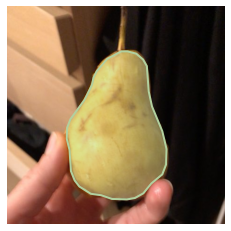

In [ ]:

img_no = 0

annIds = train_coco.getAnnIds(imgIds=img_info['id'][1])
anns = train_coco.loadAnns(annIds)

# load and render the image

plt.imshow(plt.imread(TRAIN_IMAGE_DIRECTIORY+img_info['file_name'][1]))
plt.axis('off')
# Render annotations on top of the image
train_coco.showAnns(anns)


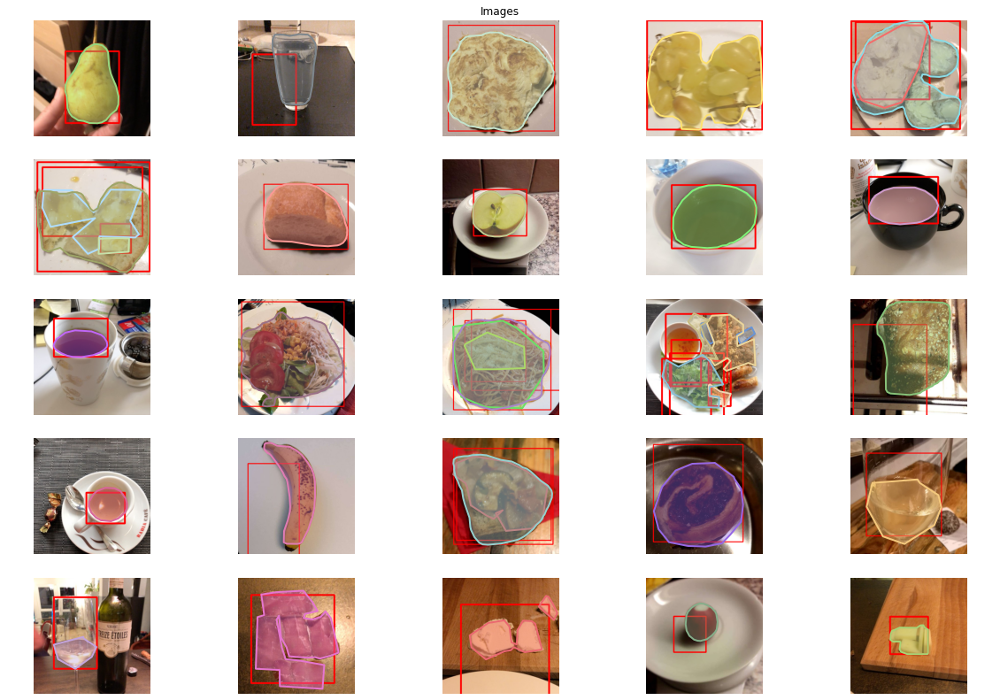

In [ ]:
w, h = 12, 12 # Setting width and height of every image
rows, cols = 5, 5 # Setting the number of image rows & cols

fig = plt.figure(figsize=(20, 14)) # Making the figure with size 

plt.title("Images") 
plt.axis('off')

# Going thought every cell in rows and cols
for i in range(1, cols * rows+1):

  annIds = train_coco.getAnnIds(imgIds=img_info['id'][i])
  anns = train_coco.loadAnns(annIds)

  fig.add_subplot(rows, cols, i)

  # Show the image

  img = plt.imread(TRAIN_IMAGE_DIRECTIORY+img_info['file_name'][i])

  for i in anns:
    [x,y,w,h] = i['bbox']
    cv2.rectangle(img, (int(x), int(y)), (int(x+h), int(y+w)), (255,0,0), 5)

  plt.imshow(img)

  # Render annotations on top of the image
  train_coco.showAnns(anns)


  # Setting the axis off
  plt.axis("off")

# Showing the figure
plt.show()

# Creating our Dataset 🔨

In this section we are goind to fix out dataset first ( because there is some issues with dataset ( size mismatch ) & creating our dataset to put into the model

## Fixing the Data

In [ ]:
# Function for taking a annotation & directiory of images and returning new annoation json with fixed image size info
def fix_data(annotations, directiory):
  for n, i in enumerate(tqdm((annotations['images']))):
   
      img = cv2.imread(directiory+i["file_name"])
 

      if img.shape[0] != i['height']:
          annotations['images'][n]['height'] = img.shape[0]
          print(i["file_name"])
          print(annotations['images'][n], img.shape)

      if img.shape[1] != i['width']:
          annotations['images'][n]['width'] = img.shape[1]
          print(i["file_name"])
          print(annotations['images'][n], img.shape)

  return annotations

    
train_annotations_data = fix_data(train_annotations_data, TRAIN_IMAGE_DIRECTIORY)

  
with open('/content/train/new_ann.json', 'w') as f:
    json.dump(train_annotations_data, f)


008618.jpg
{'id': 8618, 'file_name': '008618.jpg', 'width': 4032, 'height': 4032} (4032, 3024, 3)
008618.jpg
{'id': 8618, 'file_name': '008618.jpg', 'width': 3024, 'height': 4032} (4032, 3024, 3)
008619.jpg
{'id': 8619, 'file_name': '008619.jpg', 'width': 4032, 'height': 4032} (4032, 3024, 3)
008619.jpg
{'id': 8619, 'file_name': '008619.jpg', 'width': 3024, 'height': 4032} (4032, 3024, 3)
008621.jpg
{'id': 8621, 'file_name': '008621.jpg', 'width': 4032, 'height': 4032} (4032, 3024, 3)
008621.jpg
{'id': 8621, 'file_name': '008621.jpg', 'width': 3024, 'height': 4032} (4032, 3024, 3)
008620.jpg
{'id': 8620, 'file_name': '008620.jpg', 'width': 4032, 'height': 4032} (4032, 3024, 3)
008620.jpg
{'id': 8620, 'file_name': '008620.jpg', 'width': 3024, 'height': 4032} (4032, 3024, 3)
008626.jpg
{'id': 8626, 'file_name': '008626.jpg', 'width': 4032, 'height': 4032} (4032, 3024, 3)
008626.jpg
{'id': 8626, 'file_name': '008626.jpg', 'width': 3024, 'height': 4032} (4032, 3024, 3)
008628.jpg
{'id': 86

In [ ]:
def fix_data_val(annotations, directiory):
  for n, i in enumerate(tqdm((annotations['images']))):
   
      img = cv2.imread(directiory+i["file_name"])
      
 

      if img.shape[0] != i['height']:
          print(n)
          annotations['images'][n]['height'] = img.shape[0]
          print(i["file_name"])
          print(annotations['images'][n], img.shape)

      if img.shape[1] != i['width']:
          annotations['images'][n]['width'] = img.shape[1]
          print(i["file_name"])
          print(annotations['images'][n], img.shape)

  return annotations

val_annotations_data = fix_data_val(val_annotations_data, VAL_IMAGE_DIRECTIORY)

with open('/content/val/new_ann.json', 'w') as f:
    json.dump(val_annotations_data, f)

748
053879.jpg
{'id': 53879, 'file_name': '053879.jpg', 'width': 4608, 'height': 4608} (4608, 3456, 3)
053879.jpg
{'id': 53879, 'file_name': '053879.jpg', 'width': 3456, 'height': 4608} (4608, 3456, 3)



In [ ]:
dict_addres = val_annotations_data['images'][748]
plt.imread(VAL_IMAGE_DIRECTIORY+dict_addres['file_name']).shape[:2], (dict_addres['height'], dict_addres['width'])

((3456, 4608), (4608, 3456))

In [ ]:
for n, i in enumerate(val_annotations_data['images']):
  if i['file_name'] == '053879.jpg':
    print(n)
    print("yes") 

748
yes


## Creating our Dataset

In [ ]:
train_annotations_path = '/content/train/new_ann.json'
train_images_path = '/content/train/images'

val_annotations_path = '/content/val/new_ann.json'
val_images_path = '/content/val/images'

In [ ]:
register_coco_instances("training_dataset", {},train_annotations_path, train_images_path)

register_coco_instances("validation_dataset", {},val_annotations_path, VAL_IMAGE_DIRECTIORY)

# Creating our Model 🏭

We are going to make an Faster R-CNN Model using Detectron2, and setting up hyperpamaters to train our model

## Creating R-CNN Model

In [ ]:
cfg = get_cfg()
# Check the model zoo and use any of the models ( from detectron2 github repo)
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("training_dataset",)
cfg.DATASETS.TEST = ()

cfg.DATALOADER.NUM_WORKERS = 2
# Loading pre trained weights
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

## Setting up hyperparameters

In [ ]:
# No. of Batchs
cfg.SOLVER.IMS_PER_BATCH = 2

# Learning Rate: 
cfg.SOLVER.BASE_LR = 0.00025 

# No of Interations
cfg.SOLVER.MAX_ITER = 2000

# Images per batch (Batch Size) 
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   

# No of Categories(Classes) present
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 273

cfg.OUTPUT_DIR = "/content/logs/"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [ ]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)

[11/08 07:20:20 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 94.1MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (274, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (274,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (1092, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (1092,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the mode

# Training the Model 🚂

Setting up Tensorboard & finally training our model!

## Setting up Tensorboard

In [ ]:
!pip install --upgrade git+git://github.com/wandb/client.git

  Cloning git://github.com/wandb/client.git to /tmp/pip-req-build-coaxvwht
  Running command git clone -q git://github.com/wandb/client.git /tmp/pip-req-build-coaxvwht
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 163kB 12.2MB/s 
     |████████████████████████████████| 122kB 30.3MB/s 
     |████████████████████████████████| 102kB 11.9MB/s 
     |████████████████████████████████| 102kB 12.0MB/s 
     |████████████████████████████████| 71kB 7.6MB/s 
  Created wheel for wandb: filename=wandb-0.10.7.dev1-cp36-none-any.whl size=1693091 sha256=3222c8a75719b9aa12ceb6adced4c065c1111c0d8098a7cc6230f65173b46b03
  Stored in directory: /tmp/pip-ephem-wheel-cache-s8m9f4gs/wheels/f5/bb/45/4b2ff6f79b35baf639a4eaf2673c5df97fa21335bf82cc7bfa
Successfully built wandb
  Created wheel for subprocess32: filename=subprocess32-3.5.4-cp36-none-any.whl size=6489 sha256=797ae5ded101c517d2dd89c

In [ ]:
import wandb
wandb.init(project='food detection', sync_tensorboard=True)

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: wandb version 0.10.7 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## Start Training!

In [ ]:
trainer.train()

[11/08 07:20:34 d2.engine.train_loop]: Starting training from iteration 0
[11/08 07:20:41 d2.utils.events]:  eta: 0:10:28  iter: 19  total_loss: 6.803  loss_cls: 5.567  loss_box_reg: 0.527  loss_mask: 0.692  loss_rpn_cls: 0.026  loss_rpn_loc: 0.016  time: 0.3200  data_time: 0.0174  lr: 0.000005  max_mem: 1926M
[11/08 07:20:48 d2.utils.events]:  eta: 0:10:25  iter: 39  total_loss: 6.706  loss_cls: 5.464  loss_box_reg: 0.521  loss_mask: 0.693  loss_rpn_cls: 0.008  loss_rpn_loc: 0.012  time: 0.3217  data_time: 0.0074  lr: 0.000010  max_mem: 2090M
[11/08 07:20:54 d2.utils.events]:  eta: 0:10:24  iter: 59  total_loss: 6.288  loss_cls: 4.979  loss_box_reg: 0.626  loss_mask: 0.693  loss_rpn_cls: 0.023  loss_rpn_loc: 0.021  time: 0.3261  data_time: 0.0117  lr: 0.000015  max_mem: 2090M
[11/08 07:21:01 d2.utils.events]:  eta: 0:10:20  iter: 79  total_loss: 5.606  loss_cls: 4.338  loss_box_reg: 0.560  loss_mask: 0.692  loss_rpn_cls: 0.034  loss_rpn_loc: 0.014  time: 0.3271  data_time: 0.0073  lr:

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning:

Metadata Warning, tag 282 had too many entries: 2, expected 1

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning:

Metadata Warning, tag 283 had too many entries: 2, expected 1



[11/08 07:22:46 d2.utils.events]:  eta: 0:09:18  iter: 379  total_loss: 2.436  loss_cls: 1.109  loss_box_reg: 0.648  loss_mask: 0.675  loss_rpn_cls: 0.010  loss_rpn_loc: 0.014  time: 0.3448  data_time: 0.0291  lr: 0.000095  max_mem: 2723M
[11/08 07:22:53 d2.utils.events]:  eta: 0:09:12  iter: 399  total_loss: 2.420  loss_cls: 1.106  loss_box_reg: 0.596  loss_mask: 0.673  loss_rpn_cls: 0.014  loss_rpn_loc: 0.013  time: 0.3452  data_time: 0.0086  lr: 0.000100  max_mem: 2723M
[11/08 07:23:00 d2.utils.events]:  eta: 0:09:05  iter: 419  total_loss: 2.638  loss_cls: 1.189  loss_box_reg: 0.760  loss_mask: 0.674  loss_rpn_cls: 0.005  loss_rpn_loc: 0.011  time: 0.3454  data_time: 0.0075  lr: 0.000105  max_mem: 2723M
[11/08 07:23:07 d2.utils.events]:  eta: 0:09:00  iter: 439  total_loss: 2.604  loss_cls: 1.206  loss_box_reg: 0.669  loss_mask: 0.676  loss_rpn_cls: 0.007  loss_rpn_loc: 0.012  time: 0.3458  data_time: 0.0078  lr: 0.000110  max_mem: 2723M
[11/08 07:23:14 d2.utils.events]:  eta: 0:08

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning:

Metadata Warning, tag 282 had too many entries: 2, expected 1

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning:

Metadata Warning, tag 283 had too many entries: 2, expected 1



[11/08 07:24:49 d2.utils.events]:  eta: 0:07:29  iter: 719  total_loss: 2.147  loss_cls: 0.979  loss_box_reg: 0.628  loss_mask: 0.555  loss_rpn_cls: 0.004  loss_rpn_loc: 0.009  time: 0.3525  data_time: 0.0179  lr: 0.000180  max_mem: 2723M
[11/08 07:24:57 d2.utils.events]:  eta: 0:07:23  iter: 739  total_loss: 2.420  loss_cls: 1.120  loss_box_reg: 0.669  loss_mask: 0.596  loss_rpn_cls: 0.013  loss_rpn_loc: 0.010  time: 0.3534  data_time: 0.0262  lr: 0.000185  max_mem: 2723M
[11/08 07:25:04 d2.utils.events]:  eta: 0:07:16  iter: 759  total_loss: 2.407  loss_cls: 1.078  loss_box_reg: 0.640  loss_mask: 0.604  loss_rpn_cls: 0.009  loss_rpn_loc: 0.010  time: 0.3539  data_time: 0.0150  lr: 0.000190  max_mem: 2723M
[11/08 07:25:12 d2.utils.events]:  eta: 0:07:09  iter: 779  total_loss: 2.255  loss_cls: 0.998  loss_box_reg: 0.616  loss_mask: 0.568  loss_rpn_cls: 0.005  loss_rpn_loc: 0.009  time: 0.3545  data_time: 0.0063  lr: 0.000195  max_mem: 2723M
[11/08 07:25:19 d2.utils.events]:  eta: 0:07

# Evaluating the model 🧪

After training is done, we will evaluate our model to see how it's performing in the unseen images!

In [ ]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.01

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

evaluator = COCOEvaluator("validation_dataset", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "validation_dataset")
valResults = inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [10/17 07:39:37 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/17 07:39:37 d2.data.datasets.coco]: Loaded 1269 images in COCO format from /content/val/new_ann.json
[10/17 07:39:37 d2.data.common]: Serializing 1269 elements to byte tensors and concatenating them all ...
[10/17 07:39:37 d2.data.common]: Serialized dataset takes 3.59 MiB
[10/17 07:39:37 d2.evaluation.evaluator]: Start inference on 1269 images
[10/17 07:39:38 d2.evaluation.evaluator]: Inference done 11/1269. 0.0565 s / img. ETA=0:01:16
[10/17 07:39:43 d2.evaluation.evaluator]: Inference done 90/1269. 0.0572 s / img. ETA=0:01:15
[10/17 07:39:48 d2.evaluation.evaluator]: Inference done 164/1269. 0.0579 s / img. ETA=0:01:12
[10/17 07:39:53 d2.evaluation.evaluator]: Inference done 237/1269. 0.0580 s / img. ETA=0:01:09
[10/17 07:39:58 d2.evaluation.evaluator]: Inference done 304/1269. 0.0581 s / img. ETA=0:01:06
[10/17 07:40:04 d2.evaluation.evaluato

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning:

Metadata Warning, tag 282 had too many entries: 2, expected 1

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning:

Metadata Warning, tag 283 had too many entries: 2, expected 1

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning:

Metadata Warning, tag 34853 had too many entries: 9, expected 1



[10/17 07:40:21 d2.evaluation.evaluator]: Inference done 579/1269. 0.0584 s / img. ETA=0:00:52
[10/17 07:40:26 d2.evaluation.evaluator]: Inference done 652/1269. 0.0585 s / img. ETA=0:00:46
[10/17 07:40:31 d2.evaluation.evaluator]: Inference done 727/1269. 0.0585 s / img. ETA=0:00:40
[10/17 07:40:36 d2.evaluation.evaluator]: Inference done 802/1269. 0.0585 s / img. ETA=0:00:34
[10/17 07:40:41 d2.evaluation.evaluator]: Inference done 880/1269. 0.0585 s / img. ETA=0:00:28
[10/17 07:40:46 d2.evaluation.evaluator]: Inference done 954/1269. 0.0585 s / img. ETA=0:00:22
[10/17 07:40:51 d2.evaluation.evaluator]: Inference done 1034/1269. 0.0584 s / img. ETA=0:00:16
[10/17 07:40:56 d2.evaluation.evaluator]: Inference done 1107/1269. 0.0585 s / img. ETA=0:00:11
[10/17 07:41:01 d2.evaluation.evaluator]: Inference done 1185/1269. 0.0584 s / img. ETA=0:00:05
[10/17 07:41:06 d2.evaluation.evaluator]: Inference done 1268/1269. 0.0583 s / img. ETA=0:00:00
[10/17 07:41:07 d2.evaluation.evaluator]: Tota

In [ ]:


cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.01
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 273

cfg.DATASETS.TEST = ("validation_dataset", )
predictor = DefaultPredictor(cfg)

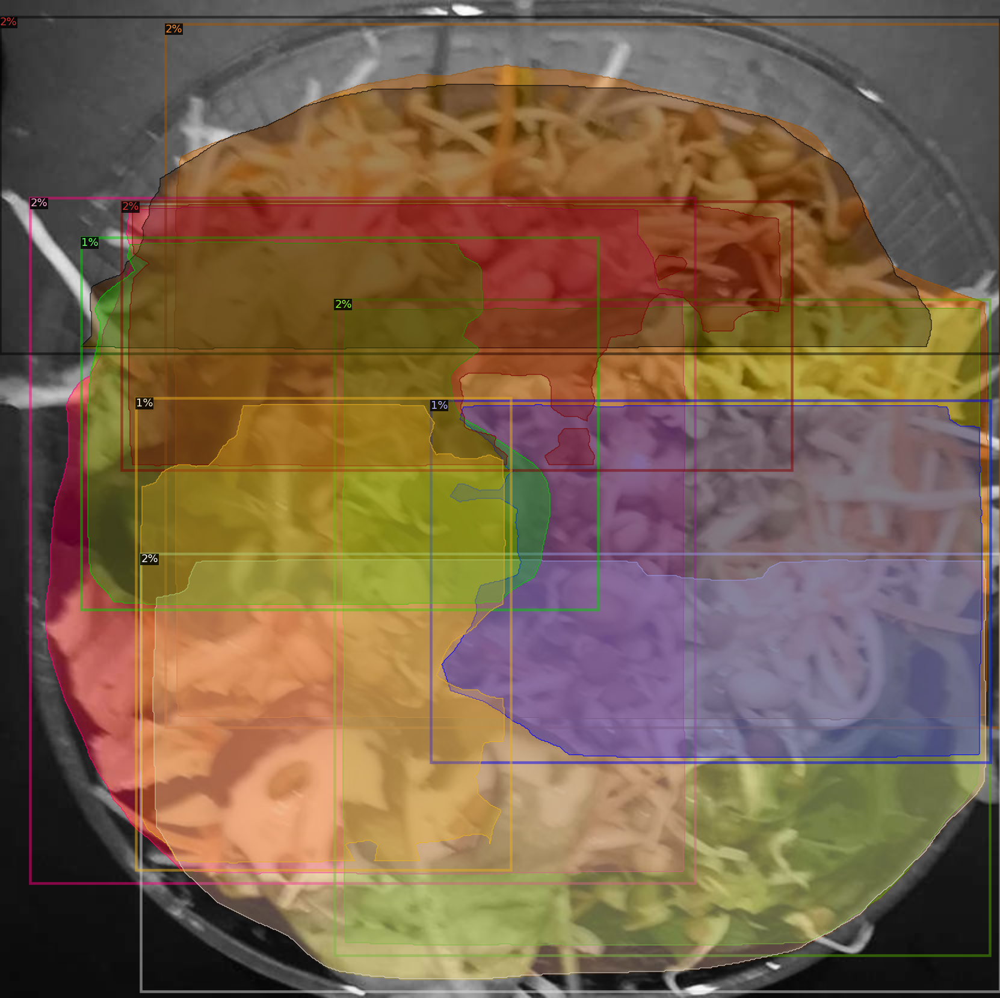

In [ ]:
val_metadata = MetadataCatalog.get("val_dataset")

im = cv2.imread("val/images/084035.jpg")

outputs = predictor(im)

v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata, 
                   scale=2, 
               

                   instance_mode=ColorMode.IMAGE_BW
    )

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
trainer.resume_or_load(resume=True)

# Making Submission on AICrowd



Step 0 : Fork the baseline to make your own changes to it. Go to settings and make the repo private.


Step 1 : Setting up SSH to login locally to Gitlab

  1. Run `ssh-keygen -t ecdsa -b 521` 
  2. Run `cat ~./ssh/id_ecdsa.pub` and copy the output
  3. Go to [Gitlab SSH Keys](https://gitlab.aicrowd.com/profile/keys) and then paste the output inside the key and use whaever title you like. 

Step 2: Clone Repo & Add Models & Push Changes

  1. Run `git clone git@gitlab.aicrowd.com:[Your Username]/food_recognition_detectron2_baseline.git`
  2. Put your model inside the data directioary and then run `git-lfs track "data/"`
  3. Run `git stage .` then `git commit -m " adding model"`
  3. Run `git push origin master`

Step 3. Create Submission

  1. Go to the repo and then tags and then New Tag. 
  2. In the tag name, use `submission-v1`, ( Everytime you make a new submission, just increase the no. like - `submission-v2`,  `submission-v3` )
  3. A new issue will be created with showing the process. Enjoy!




If you do not have SSH Keys, Check this link

Add your SSH Keys to your GitLab account by following the instructions here

In [ ]:
aicrowd_submission = {
    "author": "Shubham",
    "username": "Shubhamai",
    "description": "detectron2 trial 2",
    "model_path": "logs/model_final.pth",
    "model_type": "model_zoo",
    "model_config_file": "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml",
    "detectron_model_config": {
      "ROI_HEADS": {
        "SCORE_THRESH_TEST": 0.3,
        "NUM_CLASSES": 273
      }
    }
}

aicrowd_submission["description"] = aicrowd_submission["description"].replace(" ", "-")
with open("aicrowd.json", "w") as fp:
  json.dump(aicrowd_submission, fp)

## Submit to AIcrowd

**Note:** We will create an SSH key on your google drive. This key will be used to identify you on gitlab.aicrowd.com.

In [ ]:
from pycocotools.coco import COCO
import json

coco_api = COCO(TRAIN_ANNOTATIONS_PATH)

category_ids = sorted(coco_api.getCatIds())
categories = coco_api.loadCats(category_ids)

class_to_category = { int(class_id): int(category_id) for class_id, category_id in enumerate(category_ids) }

with open("class_to_category.json", "w") as fp:
  json.dump(class_to_category, fp)

loading annotations into memory...
Done (t=1.67s)
creating index...
index created!


In [ ]:
!bash <(curl -sL https://gitlab.aicrowd.com/jyotish/food-recognition-challenge-detectron2-baseline/raw/master/utils/submit-colab.sh)

4/6AGMvrF0BpkxiyuEgRUOBTD_5Z02OyP0lpURVjWWWOEYFMIxFdKa3Gg
4/6AGMvrF0BpkxiyuEgRUOBTD_5Z02OyP0lpURVjWWWOEYFMIxFdKa3Gg
4/6AGMvrF0BpkxiyuEgRUOBTD_5Z02OyP0lpURVjWWWOEYFMIxFdKa3Gg
4/6AGMvrF0BpkxiyuEgRUOBTD_5Z02OyP0lpURVjWWWOEYFMIxFdKa3Gg
4/6AGMvrF0BpkxiyuEgRUOBTD_5Z02OyP0lpURVjWWWOEYFMIxFdKa3Gg
Preparing the environment for submission 💪


🔍 Checking for SSH key...
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
Mounted at /content/drive
Verified! ✅

⚙️ Setting up git... 
Identity added: /content/drive/My Drive/aicrowd/id_ecdsa (/content/drive/My Dri

# Generate More Data + Some tips & tricks 💡

[CLoDSA](https://github.com/joheras/CLoDSA) seems a really great choice to generate more dataset. Fortunately there is also a really cool colab notebook on how to generate more dataset using CLoDSA

---

There is also an ongoing youtube series series from Immersive Limit on how to generate more dataset using blender ! [Blender for AI Devs](https://www.youtube.com/watch?v=UtRxC9HPGd0)

[![Blender for AI Devs](https://img.youtube.com/vi/UtRxC9HPGd0/0.jpg)](https://www.youtube.com/watch?v=UtRxC9HPGd0)

And also this -- 



[![Automated Background Switching in Blender](https://img.youtube.com/vi/wuFfd7Ndrxw/0.jpg)](https://www.youtube.com/watch?v=wuFfd7Ndrxw)

# Data Argumentation

In [ ]:
!pip install --upgrade fastai

     |████████████████████████████████| 194kB 4.5MB/s 
     |████████████████████████████████| 748.8MB 18kB/s 
     |████████████████████████████████| 51kB 7.7MB/s 
     |████████████████████████████████| 5.9MB 49.7MB/s 
  Found existing installation: torch 1.5.0+cu101
    Uninstalling torch-1.5.0+cu101:
      Successfully uninstalled torch-1.5.0+cu101
  Found existing installation: torchvision 0.6.0+cu101
    Uninstalling torchvision-0.6.0+cu101:
      Successfully uninstalled torchvision-0.6.0+cu101
  Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61


In [ ]:
from fastai.vision.core import *
from fastai.vision.utils import *
from fastai.vision.augment import *
from fastai.data.core import *
from fastai.data.transforms import *

In [ ]:
images, lbl_bbox = get_annotations('/content/train/annotations.json')
# idx=2
# coco_fn,bbox = coco/'train'/images[idx],lbl_bbox[idx]

# def _coco_bb(x):  return TensorBBox.create(bbox[0])
# def _coco_lbl(x): return bbox[1]

In [ ]:
idx=4
coco_fn,bbox = '/content/train/images/'+images[idx],lbl_bbox[idx]

def _coco_bb(x):  return TensorBBox.create(bbox[0])
def _coco_lbl(x): return bbox[1]


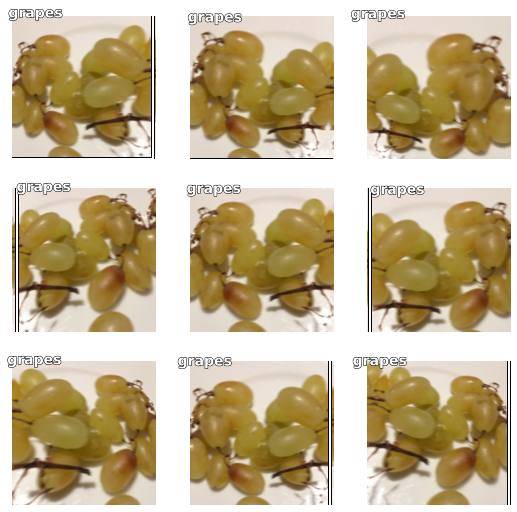

In [ ]:
coco_dsrc = Datasets([coco_fn]*10, [PILImage.create, [_coco_bb,], [_coco_lbl, MultiCategorize(add_na=True)]], n_inp=1)
coco_tdl = TfmdDL(coco_dsrc, bs=9, after_item=[BBoxLabeler(), PointScaler(), ToTensor(), Resize(256)],
                  after_batch=[IntToFloatTensor(), *aug_transforms()])

coco_tdl.show_batch(max_n=9)